This notebook consists of an exploratory data analysis for the normal data available in the 3W Dataset. For more details about the dataset, check [VARGAS et al. (2019)](https://linkinghub.elsevier.com/retrieve/pii/S0920410519306357). For more in-depth exploratory analysis of the 3W Dataset and others process systems engineering datasets, check [MELO et al. (2022)](https://www.sciencedirect.com/science/article/abs/pii/S0098135422003003).

In [1]:
EVENT = 4

In [2]:
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import scipy.spatial
import sklearn.preprocessing

color_cycle = plt.rcParams['axes.prop_cycle'].by_key()['color']

import gc

## Reference table of variables

In [3]:
tags = {'P-PDG':'Pa', 
        'P-TPT':'Pa', 'T-TPT':'degC',
         'P-MON-CKP':'Pa', 'T-JUS-CKP':'degC', 
         'P-JUS-CKGL':'Pa', 'T-JUS-CKGL':'degC',
         'QGL': 'sm^3/s'}

names = ['Pressure at the PDG',
         'Pressure at the TPT',
         'Temperature at the TPT',
         'Pressure upstream of the PCK',
         'Temperature downstream of the PCK',
         'Pressure downstream of the GLCK',
         'Temperature downstream of the GLCK',
         'Gas lift flow rate']

reference_table = pd.DataFrame(index=np.arange(1,len(names)+1))
reference_table.index.name='Number'
reference_table['Tag'] = tags.keys()
reference_table['Name'] = names
reference_table['Unit'] = tags.values()
reference_table

,Tag,Name,Unit
Number,,,
1,P-PDG,Pressure at the PDG,Pa
2,P-TPT,Pressure at the TPT,Pa
3,T-TPT,Temperature at the TPT,degC
4,P-MON-CKP,Pressure upstream of the PCK,Pa
5,T-JUS-CKP,Temperature downstream of the PCK,degC
6,P-JUS-CKGL,Pressure downstream of the GLCK,Pa
7,T-JUS-CKGL,Temperature downstream of the GLCK,degC
8,QGL,Gas lift flow rate,sm^3/s


In [4]:
plt.rc('font', family='serif', size=12) # controls default text sizes
plt.rc('axes', titlesize=14)     # fontsize of the axes title
plt.rc('axes', labelsize=13)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=13)    # fontsize of the tick labels
plt.rc('ytick', labelsize=13)    # fontsize of the tick labels
plt.rc('legend', fontsize=12)    # legend fontsize
plt.rc('figure', titlesize=14)  # fontsize of the figure title

## Data importing

In [5]:
%%time

PATH = f'/kaggle/input/3w-dataset/3W/{EVENT}/'

files = [f for f in os.listdir(PATH) if os.path.isfile(os.path.join(PATH, f))]
files

dfs = {}

for file in files:
    
    dfs[file[:-4]] = pd.read_csv(f'{PATH}{file}', index_col = 0,
                     parse_dates = True).rename_axis(None)

wells_numbers = []
    
for key in dfs.keys():
    if 'SIMULATED' in key or 'DRAWN' in key:
        continue
    else:
        wells_numbers.append(int(key[8:10]))
    
print('Data read!\nNumber of instances: ',len(dfs))
print('Number of real instances: ',len(wells_numbers))

Data read!
Number of instances:  344
Number of real instances:  344
CPU times: user 5.83 s, sys: 1.29 s, total: 7.12 s
Wall time: 10.1 s


## Visualization

### Plotting all instances

The function below is for plotting faulty instances for the three available data types: simulated, hand-drawn and real data.

In [6]:
def plot_faulty_instances(n_rows, n_cols, figsize,data_type='WELL', graphs_per_plot = 100, subset = 1):
    
    fig = plt.figure(constrained_layout=True, figsize=figsize)
    subfigs = fig.subfigures(n_rows, n_cols, wspace=0.07)

    title = {'SIMULATED': 'Simulation',
             'DRAWN': 'Drawn data',
             'WELL': 'Well'}

    if data_type == 'SIMULATED' or data_type == 'DRAWN':
        slice_number = slice(-5,None)
    elif data_type == 'WELL':
        slice_number = slice(5,10)

    j=0
    
    for key in sorted(dfs.keys()):
        
        if j+1<=((subset-1)*100):
            j+=1
            continue
        if j == subset*graphs_per_plot:
            break
            
        if data_type not in key:
            continue

        df_plot = dfs[key]

        ax = subfigs.ravel()[j-(subset-1)*100].subplots(8, 1, sharex=True)

        for i in range(8):
            ax[i].plot(df_plot.index,df_plot.iloc[:,i],c='k',linewidth=0.8)
            ax[i].set_ylabel(i+1,rotation=0,fontsize=14)
            ax[i].set_yticks([])
            ax[i].spines["top"].set_visible(False)
            ax[i].spines["right"].set_visible(False)
            ax[i].spines["left"].set_visible(False)
            ax[i].fill_between(df_plot.index, ax[i].get_ylim()[0], ax[i].get_ylim()[1],
                                where=(df_plot['class']==(EVENT+100)), 
                                alpha=0.2,color='red')
            ax[i].fill_between(df_plot.index,ax[i].get_ylim()[0], ax[i].get_ylim()[1],
                                where=(df_plot['class']==EVENT), 
                                alpha=0.6,color='red')
            ax[i].set_xticks([])
            ax[i].spines["bottom"].set_visible(False)
            ax[i].xaxis.set_ticks_position('none')
        
        title_str = title[data_type]+f' {int(key[slice_number])}'
        if data_type == 'WELL':
            title_str = title_str + f'\n {df_plot.index[0]} to {df_plot.index[-1]}'
        ax[0].set_title(title_str)
        
        gc.collect()

        j+=1
        
    # suptitle instead of title makes the execution very slow, because of the constrained_layout used
    #for j in range(len(subfigs.ravel())):
    #    subfigs.ravel()[j].suptitle(f'Simulation {int(key[-5:])}')

In the following graphs, the light red background indicates faulty transient periods, in which the abnormal events are still developing; the dark red background indicates faulty steady-state periods, in which the abnormal events are fully developed.

#### Real data

CPU times: user 1min 20s, sys: 1.39 s, total: 1min 21s
Wall time: 1min 21s


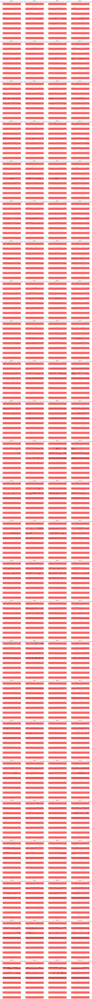

In [7]:
%%time

plot_faulty_instances(25,4,(18,200),'WELL')

CPU times: user 1min 22s, sys: 132 ms, total: 1min 22s
Wall time: 1min 22s


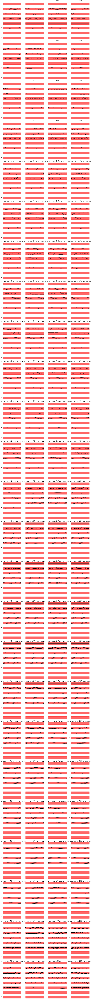

In [8]:
%%time

plot_faulty_instances(25,4,(18,200),'WELL',subset=2)

CPU times: user 1min 24s, sys: 47.9 ms, total: 1min 24s
Wall time: 1min 24s


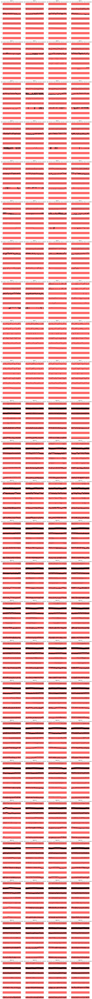

In [9]:
%%time

plot_faulty_instances(25,4,(18,200),'WELL',subset=3)

CPU times: user 28.3 s, sys: 22 ms, total: 28.3 s
Wall time: 28.3 s


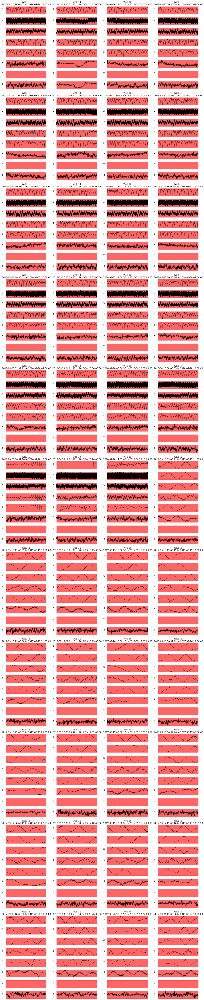

In [10]:
%%time

plot_faulty_instances(11,4,(18,90),'WELL',subset=4)

The behavior of the data mainly consists of oscillations. There are no normal and transient phases in this case. 